In [2]:
import numpy as np
import cv2
import matplotlib.pyplot as plt
import os
from os import listdir

In [2]:
# im = cv2.imread("data/ABC/spectrograms/2019001/00_02_30.jpg")

In [3]:
# plt.imshow(im)
#image_list = ["04_37_30_sig.jpg", '00_25_00.jpg', '00_27_30.jpg','00_52_30.jpg','00_25_00.jpg','00_35_00.jpg', 
              #'01_00_00', '04_37_30_sig.jpg']
# image
day3 = (listdir("data/ABC/spectrograms/2019003"))
sig_list = [x for x in day3 if 'sig' in x]
sig_list = sorted(sig_list)
sig_list = sig_list[1:]

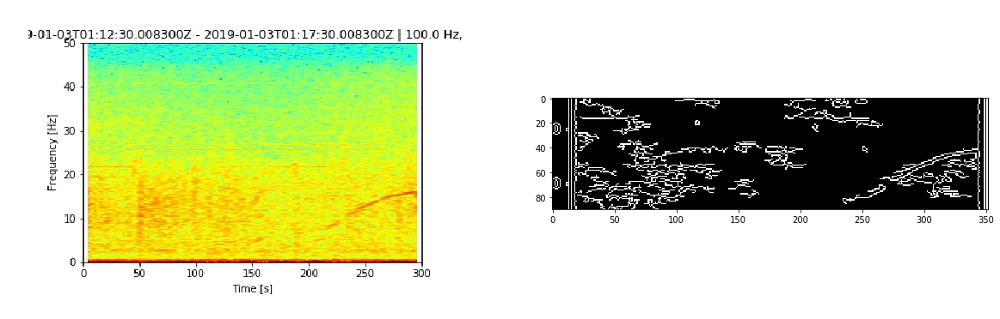

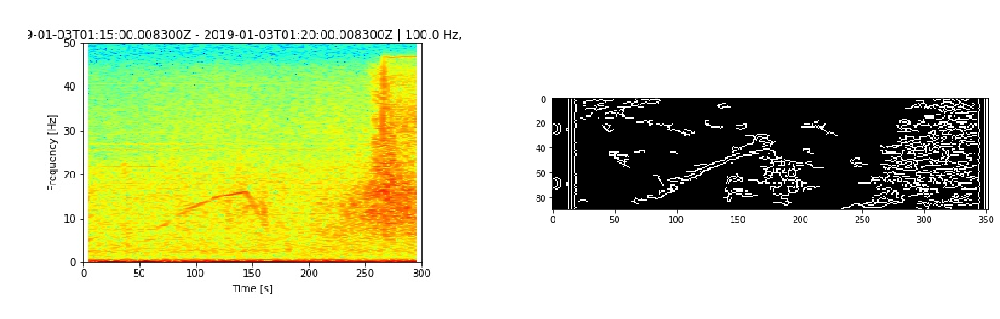

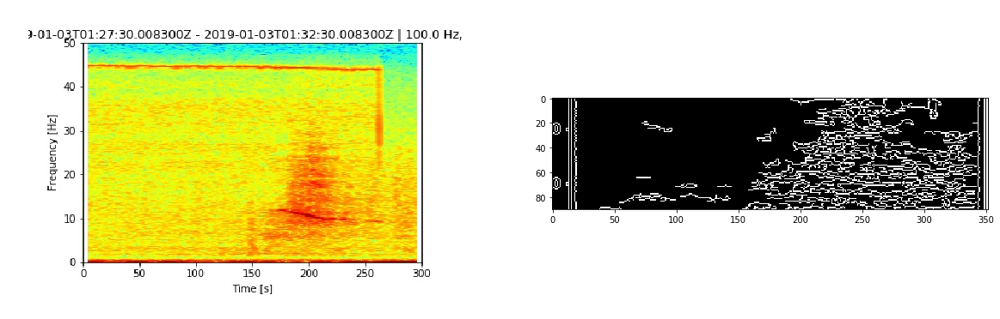

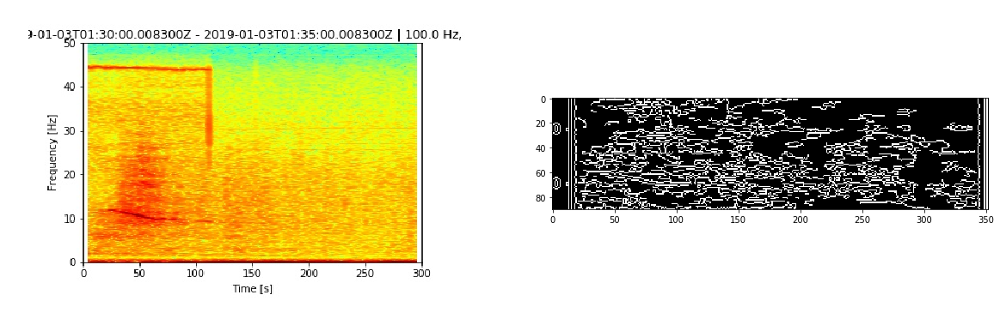

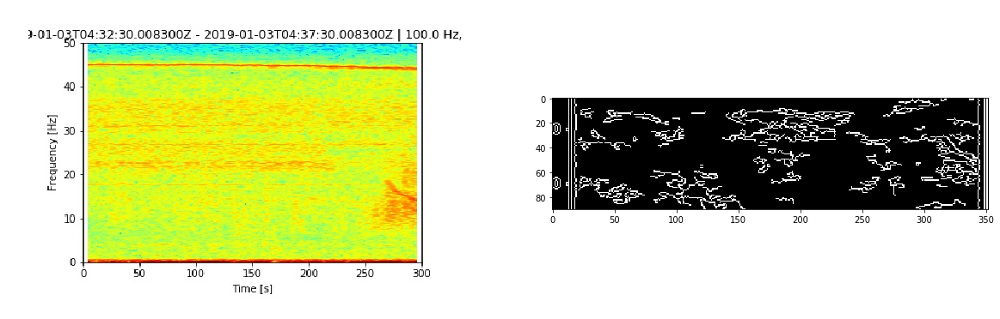

...

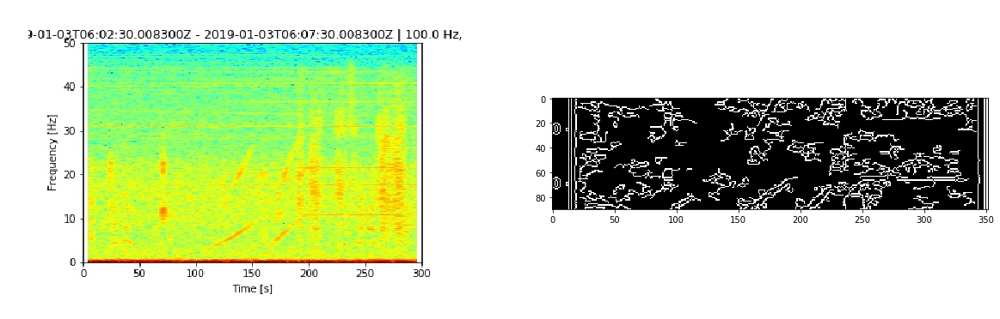

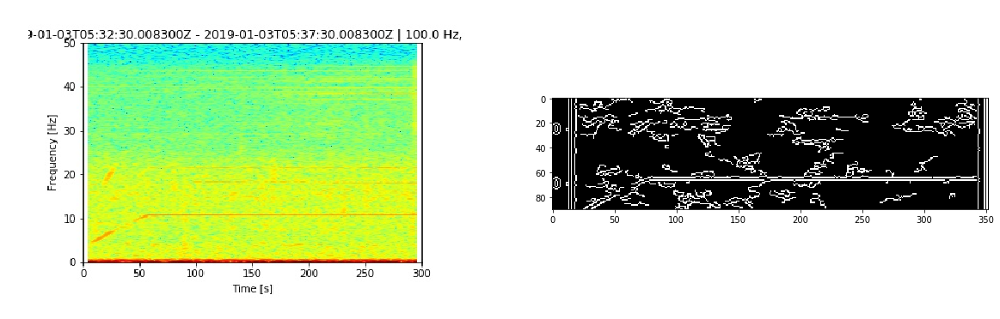

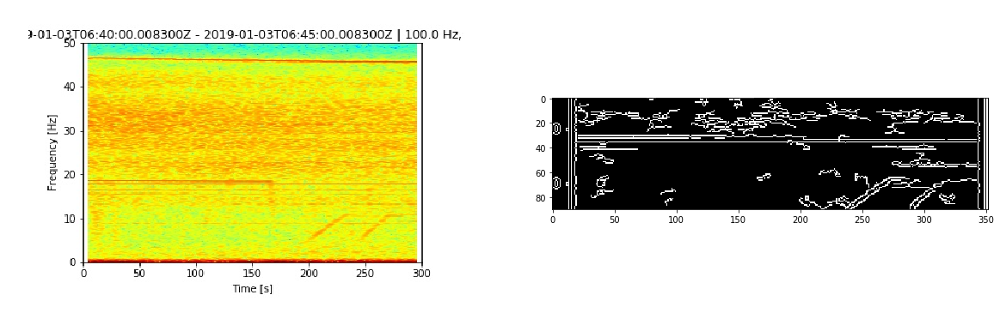

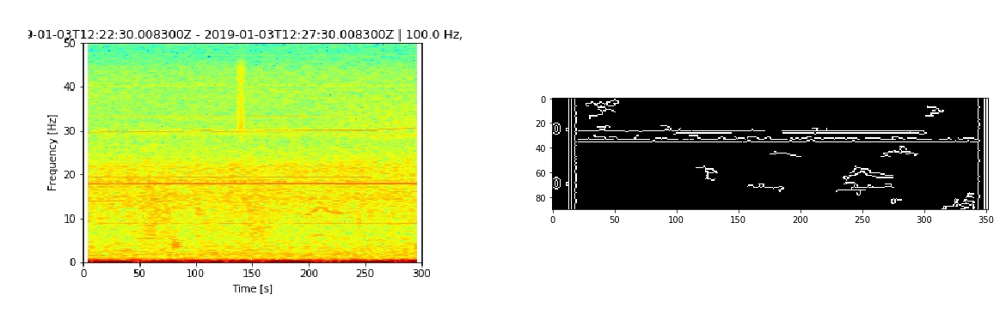

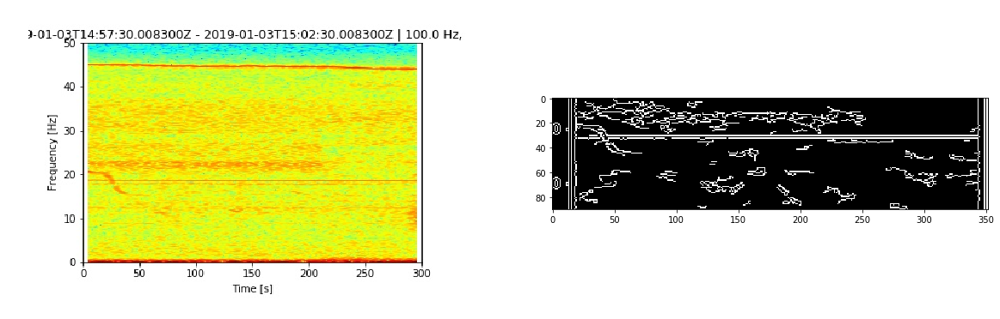

In [5]:
for i in range(len(sig_list)):
    #show normal version
    im = cv2.imread("data/ABC/spectrograms/2019003/" + sig_list[i])
    RGB_img = cv2.cvtColor(im, cv2.COLOR_BGR2RGB)
    fig, (ax1, ax2) = plt.subplots(1,2, figsize=(20, 10))
    ax1.axis('off')
    ax1.imshow(RGB_img)
    
    #show mask version
    res = cv2.cvtColor(im, cv2.COLOR_BGR2RGB)
    res = res[140:230, 40:-40, :]
    #lower_red = np.array([180,0,0])
    #upper_red = np.array([255,180,40])
    #mask = cv2.inRange(rgb, lower_red, upper_red)
    #res = cv2.bitwise_and(rgb,rgb, mask= mask)
    
    #gray = cv2.cvtColor(res, cv2.COLOR_RGB2GRAY)
    plt.rc('image', cmap='gray')
    #gray_filtered = cv2.bilateralFilter(gray, 7, 100, 100)
    #res = cv2.blur(res,(7,1))
    #Creates canny edges
    display = cv2.Canny(res, 90, 300)
    ax2.imshow(display)

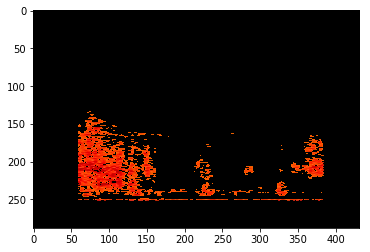

In [4]:
rgb = cv2.cvtColor(im, cv2.COLOR_BGR2RGB)
lower_red = np.array([180,0,0])
upper_red = np.array([255,100,30])
mask = cv2.inRange(rgb, lower_red, upper_red)
res = cv2.bitwise_and(rgb,rgb, mask= mask)
plt.imshow(res)

plt.imshow(res)

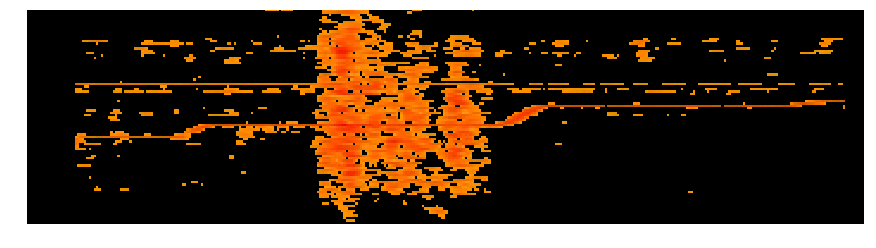

In [12]:
res_short = res[140:230, 40:-40, :]
fig, ax = plt.subplots(1,1, figsize=(15, 10))
ax.axis('off')
plt.imshow(res_short)

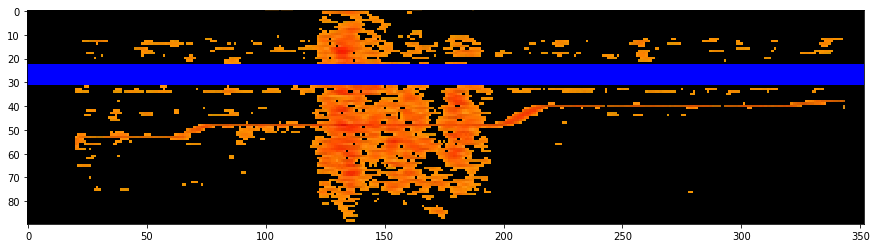

In [18]:
gray = cv2.cvtColor(res_short,cv2.COLOR_BGR2GRAY)
edges = cv2.Canny(gray,50,150,apertureSize = 3)

lines = cv2.HoughLines(edges,1,np.pi/180,200)
for rho,theta in lines[0]:
    a = np.cos(theta)
    b = np.sin(theta)
    x0 = a*rho
    y0 = b*rho
    x1 = int(x0 + 1000*(-b))
    y1 = int(y0 + 1000*(a))
    x2 = int(x0 - 1000*(-b))
    y2 = int(y0 - 1000*(a))

    cv2.line(res_short,(x1,y1),(x2,y2),(0,0,255),2)

cv2.imshow('houghlines3.jpg',res_short)
fig, ax = plt.subplots(1,1, figsize=(15, 10))
plt.imshow(res_short)